In [1]:
import numpy as np
import pandas as pd
from scipy import sparse
import matplotlib.pyplot as plt
import networkx as nx
import seaborn as sns
import matplotlib.ticker as ticker

In [2]:
#Importing nodes and edges of initial data (csv files)
nodes = pd.read_csv('nodes(1).csv')
edges = pd.read_csv('edges(1).csv')

In [3]:
#Print the main info of nodes
nodes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 125 entries, 0 to 124
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   Index      125 non-null    object
 1   Character  125 non-null    object
 2   Race       125 non-null    object
 3   Gender     125 non-null    object
dtypes: object(4)
memory usage: 4.0+ KB


In [6]:
#Print the main info of edges
edges.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1105 entries, 0 to 1104
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   From    1104 non-null   object
 1   To      1101 non-null   object
 2   weight  1105 non-null   int64 
dtypes: int64(1), object(2)
memory usage: 26.0+ KB


In [25]:
#Checking for null values in nodes
nodes.isnull().sum()

Index        0
Character    0
Race         0
Gender       0
dtype: int64

In [24]:
#Checking for null values in edges
edges.isnull().sum()

From      1
To        4
weight    0
dtype: int64

In [5]:
#Counting how many unique characters we have, to check for duplicates
n_charact=nodes.Character.nunique()
print("There are", n_charact, "unique characters in the dataset")

There are 125 unique characters in the dataset


In [7]:
#Counting how many races we have
n_races=nodes.Race.nunique()
print("There are", n_races, "races represented in our dataset")

There are 10 races represented in our dataset


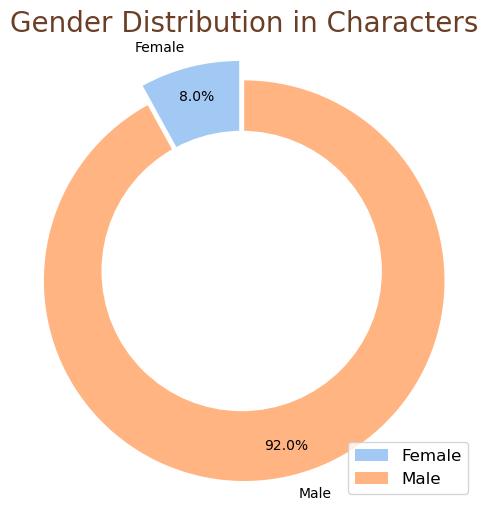

In [12]:
#We are plotting a pie bar to check gender distribution

plt.figure(figsize=(6,6))
plt.title("Gender Distribution in Characters", fontsize=20, color='#6B3E26')


gender_counts = nodes.groupby('Gender').size()
colors = sns.color_palette('pastel')[0:len(gender_counts)]


plt.pie(gender_counts, colors=colors, labels=gender_counts.index, autopct='%1.1f%%', startangle=90, pctdistance=0.85, explode = [0.05]*len(gender_counts))

#white circle at the center
centre_circle = plt.Circle((0,0),0.70,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.axis('equal')  
plt.legend(loc='lower right', labels=gender_counts.index, fontsize=12)


plt.show()


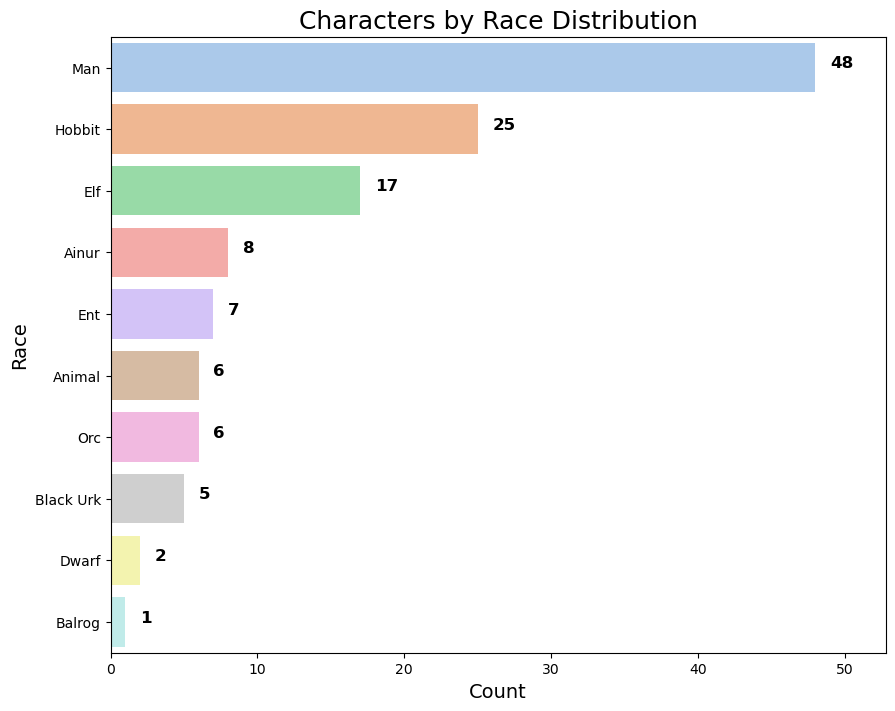

In [16]:
#We will now plot a bar graph for checking Race distribution

palette_cubehelix = sns.color_palette('pastel', n_colors=len(nodes['Race'].unique()))

# Group the dataframe by race and sort the values in descending order
race_counts = nodes.groupby('Race').size().sort_values(ascending=False)

plt.figure(figsize=(10, 8))
sns.barplot(x=race_counts.values, y=race_counts.index, palette=palette_cubehelix)

plt.xlabel('Count', fontsize=14)
plt.ylabel('Race', fontsize=14)
plt.title('Characters by Race Distribution', fontsize=18)

# Add total count labels to the right of each bar
for i, v in enumerate(race_counts.values):
    plt.text(v + 1, i, str(v), fontsize=12, fontweight='bold', color='black')

# Adjust x-axis limit
plt.xlim(0, max(race_counts.values) * 1.1)

# Show the plot
plt.show()


We can see that **most of the characters are male** (there are just 10 females) and that, regarding races, **Man is the most common one**, representing almost a 40% of the total, followed by Hobbits (20%) and Elves (around 14%). 

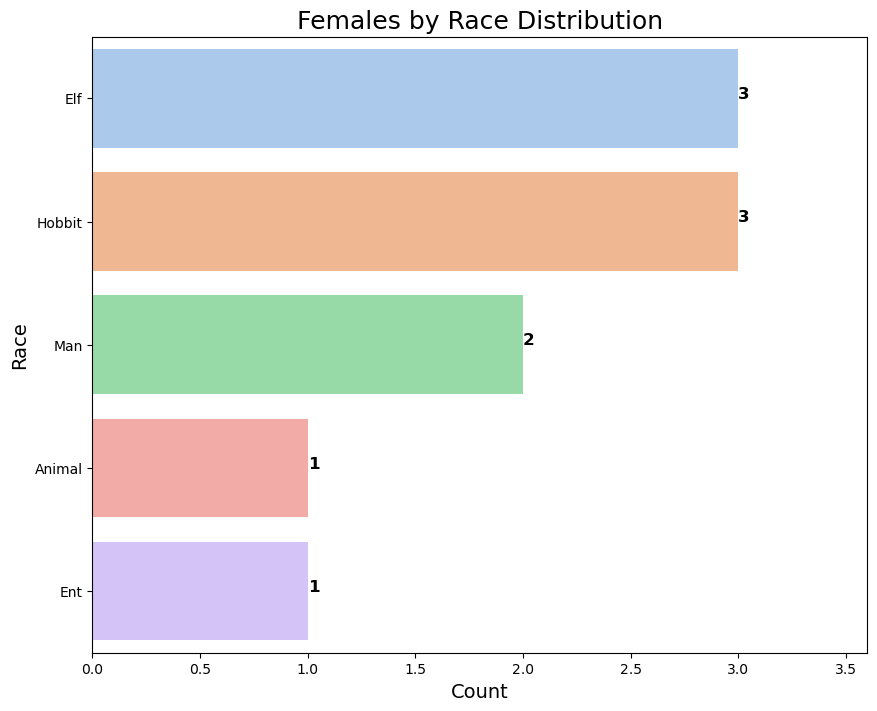

In [124]:
#Now, we are going to plot the same graph but just considering female characters
# Filter the dataframe to include only female characters
female_df = nodes[nodes['Gender'] == 'Female']

# Group the dataframe by race and sort the values in descending order
race_f_counts = female_df.groupby('Race').size().sort_values(ascending=False)

# Create the bar chart
plt.figure(figsize=(10, 8))
sns.barplot(x=race_f_counts.values, y=race_f_counts.index, palette=palette_cubehelix)

# Set labels and title for the plot
plt.xlabel('Count', fontsize=14)
plt.ylabel('Race', fontsize=14)
plt.title('Females by Race Distribution', fontsize=18)

# Add total count labels to the right of each bar
for i, v in enumerate(race_f_counts.values):
    plt.text(v , i, str(v), fontsize=12, fontweight='bold', color='black')
    

# Adjust x-axis limit
plt.xlim(0, max(race_f_counts.values) * 1.2)  # Increase the limit

# Show the plot
plt.show()



In [27]:
#drop rows with null values in eda_df
edges.dropna(inplace=True)

In [29]:
#We create columns with the names of the characters instead of the index
edges['Source'] = edges['From'].map(nodes.set_index('Index')['Character'])
edges['Recipient'] = edges['To'].map(nodes.set_index('Index')['Character'])

edges['Source_race'] = edges['From'].map(nodes.set_index('Index')['Race'])
edges['Recipient_race'] = edges['To'].map(nodes.set_index('Index')['Race'])

edges['Source_gender'] = edges['From'].map(nodes.set_index('Index')['Gender'])
edges['Recipient_gender'] = edges['To'].map(nodes.set_index('Index')['Gender'])

In [31]:
edges.head()

,From,To,weight,Source,Recipient,Source_race,Recipient_race,Source_gender,Recipient_gender
0,n45,n30,28,Frodo,Elrond,Hobbit,Elf,Male,Male
1,n45,n49,47,Frodo,Gandalf,Hobbit,Ainur,Male,Male
2,n45,n95,21,Frodo,Saruman,Hobbit,Ainur,Male,Male
3,n45,n101,10,Frodo,Theoden,Hobbit,Man,Male,Male
4,n45,n110,29,Frodo,Sauron,Hobbit,Ainur,Male,Male


In [33]:
# Counting the total number of appearances for each character
source_appearances = edges['Source'].value_counts()
recipient_appearances = edges['Recipient'].value_counts()
total_appearances = pd.concat([source_appearances, recipient_appearances]).groupby(level=0).sum()

# Top 10 characters with the most appearances
top_10_characters = total_appearances.nlargest(10)
print("\n**Top 10 Characters:**")
for character, count in top_10_characters.items():
    print(f"- {character}: {count} appearances")

# Bottom 10 characters with the least appearances
bottom_10_characters = total_appearances.nsmallest(10)
print("\n**Bottom 10 Characters:**")
for character, count in bottom_10_characters.items():
    print(f"- {character}: {count} appearances")



**Top 10 Characters:**
- Frodo: 99 appearances
- Aragorn: 79 appearances
- Sauron: 71 appearances
- Bilbo: 70 appearances
- Gandalf: 65 appearances
- Sam: 55 appearances
- Elrond: 54 appearances
- Boromir: 43 appearances
- Denethor: 40 appearances
- Gimli: 37 appearances

**Bottom 10 Characters:**
- Angbor: 1 appearances
- Rosie Cotton: 1 appearances
- Willie Banks: 2 appearances
- Asfaloth: 3 appearances
- Beechbone: 3 appearances
- Ceorl: 4 appearances
- Ghan-buri-Ghan: 4 appearances
- Damrod: 5 appearances
- Barliman Butterbur: 6 appearances
- Goldberry: 6 appearances


### 3. Creating the Graph and analyzing its metrics

In [35]:
#We are going to create a graph with the weighted edges dataset using networkx
weightededges = pd.read_csv('weightededges.csv')
weightededges ["From"] = weightededges ["From"].astype(str)
weightededges ["To"] = weightededges ["To"].astype(str)
G = nx.Graph()
G = nx. from_pandas_edgelist(weightededges, source='From',target='To',edge_attr="weight")

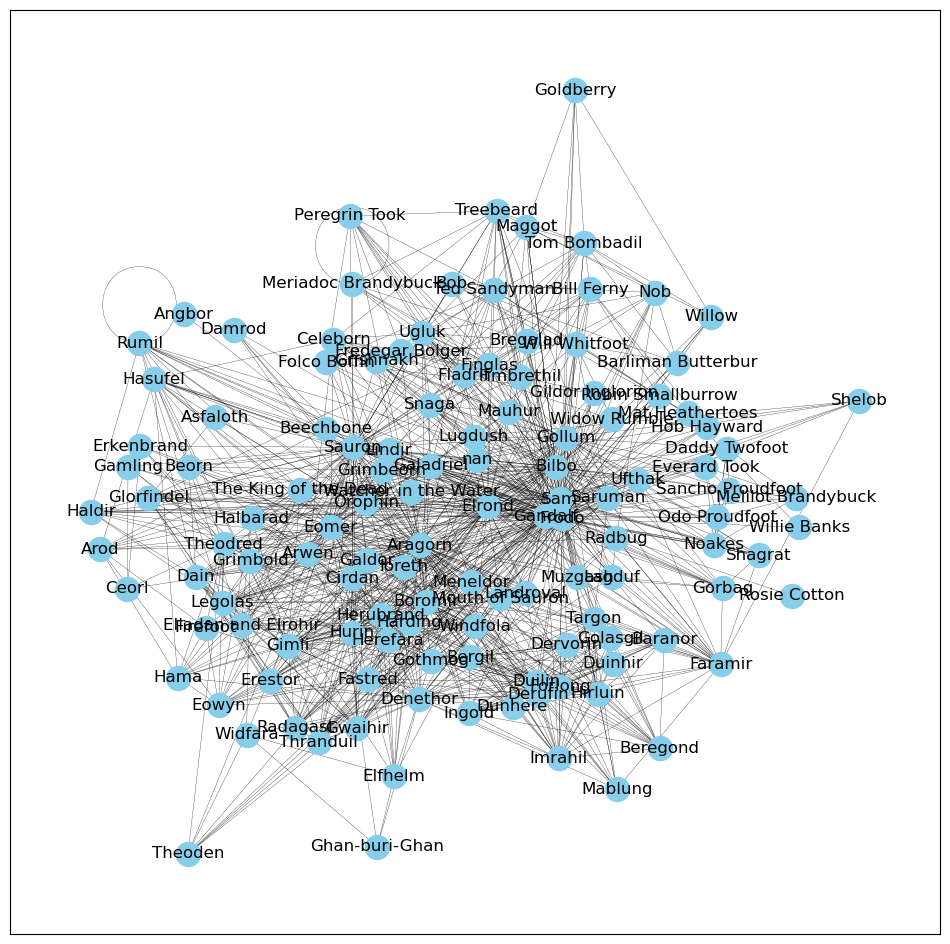

In [36]:
plt.figure(figsize=(12,12))
pos = nx.kamada_kawai_layout(G)
nx.draw_networkx(G, with_labels=True, node_color='skyblue', edge_cmap=plt.cm.Blues, pos = pos, width=0.2)
plt.show()

In [37]:
print('Number of edges: {}'.format(G.number_of_edges()))

Number of edges: 1105


In [41]:
print(G.edges())

[('Frodo', 'Elrond'), ('Frodo', 'Gandalf'), ('Frodo', 'Saruman'), ('Frodo', 'Theoden'), ('Frodo', 'Sauron'), ('Frodo', 'Bilbo'), ('Frodo', 'Celeborn'), ('Frodo', 'Faramir'), ('Frodo', 'Galadriel'), ('Frodo', 'Sam'), ('Frodo', 'Gollum'), ('Frodo', 'Melilot Brandybuck'), ('Frodo', 'Noakes'), ('Frodo', 'Odo Proudfoot'), ('Frodo', 'Sancho Proudfoot'), ('Frodo', 'Everard Took'), ('Frodo', 'Daddy Twofoot'), ('Frodo', 'Folco Boffin'), ('Frodo', 'Fredegar Bolger'), ('Frodo', 'Ted Sandyman'), ('Frodo', 'Peregrin Took'), ('Frodo', 'Gildor Inglorion'), ('Frodo', 'Maggot'), ('Frodo', 'Tom Bombadil'), ('Frodo', 'Goldberry'), ('Frodo', 'Willow'), ('Frodo', 'Bob'), ('Frodo', 'Barliman Butterbur'), ('Frodo', 'Nob'), ('Frodo', 'Will Whitfoot'), ('Frodo', 'Bill Ferny'), ('Frodo', 'Glorfindel'), ('Frodo', 'Beorn'), ('Frodo', 'Dain'), ('Frodo', 'Elladan and Elrohir'), ('Frodo', 'Grimbeorn'), ('Frodo', 'Lindir'), ('Frodo', 'Boromir'), ('Frodo', 'Cirdan'), ('Frodo', 'Denethor'), ('Frodo', 'Erestor'), ('Frod

In [38]:
print('Number of nodes: {}'.format(G.number_of_nodes()))

Number of nodes: 125


In [40]:
print(G.nodes())

['Frodo', 'Elrond', 'Gandalf', 'Saruman', 'Theoden', 'Sauron', 'Bilbo', 'Meriadoc Brandybuck', 'Aragorn', 'Arwen', 'Celeborn', 'Faramir', 'Galadriel', 'Sam', 'Gollum', 'Melilot Brandybuck', 'Noakes', 'Odo Proudfoot', 'Sancho Proudfoot', 'Everard Took', 'Daddy Twofoot', 'Folco Boffin', 'Fredegar Bolger', 'Ted Sandyman', 'Peregrin Took', 'Gildor Inglorion', 'Maggot', 'Tom Bombadil', 'Goldberry', 'Willow', 'Bob', 'Barliman Butterbur', 'Nob', 'Will Whitfoot', 'Bill Ferny', 'Asfaloth', 'Glorfindel', 'Beorn', 'Dain', 'Elladan and Elrohir', 'Grimbeorn', 'Lindir', 'Boromir', 'Cirdan', 'Denethor', 'Erestor', 'Galdor', 'Gimli', 'Gwaihir', 'Hurin', 'Legolas', 'Radagast', 'Thranduil', 'nan', 'Watcher in the Water', 'Haldir', 'Orophin', 'Rumil', 'Arod', 'Eomer', 'Hasufel', 'Grishnakh', 'Lugdush', 'Mauhur', 'Snaga', 'Ugluk', 'Bregalad', 'Fimbrethil', 'Finglas', 'Fladrif', 'Treebeard', 'Eowyn', 'Firefoot', 'Hama', 'Theodred', 'Ceorl', 'Erkenbrand', 'Gamling', 'Elfhelm', 'Grimbold', 'Beechbone', 'Damr

#### Is this graph directed or undirected 

In [44]:
G.is_directed()

False

### The averge degree

In [48]:
degree=G.degree()
degree_list=[]
for(n,d) in degree:
    degree_list.append(d)
av_degree=sum(degree_list)/len(degree_list)
print('The averge degree is : '+str(av_degree))

The averge degree is : 17.68


### Degree Distribution and Averge Degree Graph

Text(0.5, 1.0, 'Node degree')

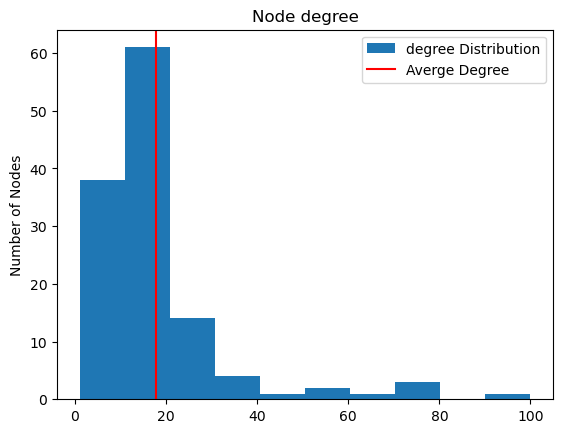

In [49]:
plt.hist(degree_list,label='degree Distribution')
plt.axvline(av_degree,color='r',label='Averge Degree')
plt.legend()
plt.ylabel('Number of Nodes')
plt.title('Node degree')

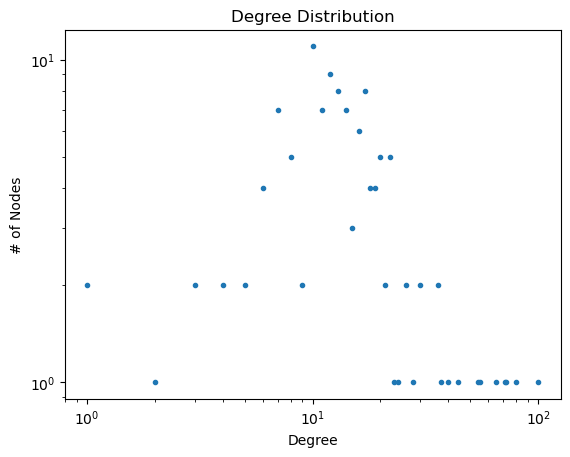

In [55]:
hist = nx.degree_histogram(G)  

plt.plot(range(0, len(hist)), hist, ".")
plt.title("Degree Distribution")
plt.xlabel("Degree")
plt.ylabel("# of Nodes")
plt.loglog()
plt.show()

### Centrality Measures

### Degree Centrality

In [52]:
from operator import itemgetter
degree_dict = dict(G.degree(G.nodes(), weight="weight"))
nx.set_node_attributes(G, degree_dict, 'degree')
sorted_degree = sorted(degree_dict.items(), key=itemgetter(1), reverse=True)

In [53]:
#We are going to print the top 10 nodes by weighted degree
print("Top 10 nodes by degree:")
for d in sorted_degree[:10]:
    print(d)

Top 10 nodes by degree:
('Frodo', 533)
('Sauron', 411)
('Aragorn', 385)
('Sam', 354)
('Gandalf', 352)
('Bilbo', 302)
('Elrond', 285)
('Gimli', 247)
('Legolas', 216)
('Gollum', 173)


In [51]:
nx.degree_centrality(G)

{'Frodo': 0.8064516129032258,
 'Elrond': 0.43548387096774194,
 'Gandalf': 0.5241935483870968,
 'Saruman': 0.12903225806451613,
 'Theoden': 0.06451612903225806,
 'Sauron': 0.5806451612903225,
 'Bilbo': 0.5725806451612903,
 'Meriadoc Brandybuck': 0.07258064516129031,
 'Aragorn': 0.6451612903225806,
 'Arwen': 0.18548387096774194,
 'Celeborn': 0.13709677419354838,
 'Faramir': 0.2096774193548387,
 'Galadriel': 0.24193548387096775,
 'Sam': 0.4435483870967742,
 'Gollum': 0.29032258064516125,
 'Melilot Brandybuck': 0.056451612903225805,
 'Noakes': 0.08064516129032258,
 'Odo Proudfoot': 0.08064516129032258,
 'Sancho Proudfoot': 0.08064516129032258,
 'Everard Took': 0.08064516129032258,
 'Daddy Twofoot': 0.08064516129032258,
 'Folco Boffin': 0.06451612903225806,
 'Fredegar Bolger': 0.08064516129032258,
 'Ted Sandyman': 0.10483870967741934,
 'Peregrin Took': 0.10483870967741934,
 'Gildor Inglorion': 0.056451612903225805,
 'Maggot': 0.08064516129032258,
 'Tom Bombadil': 0.12096774193548387,
 'Gold

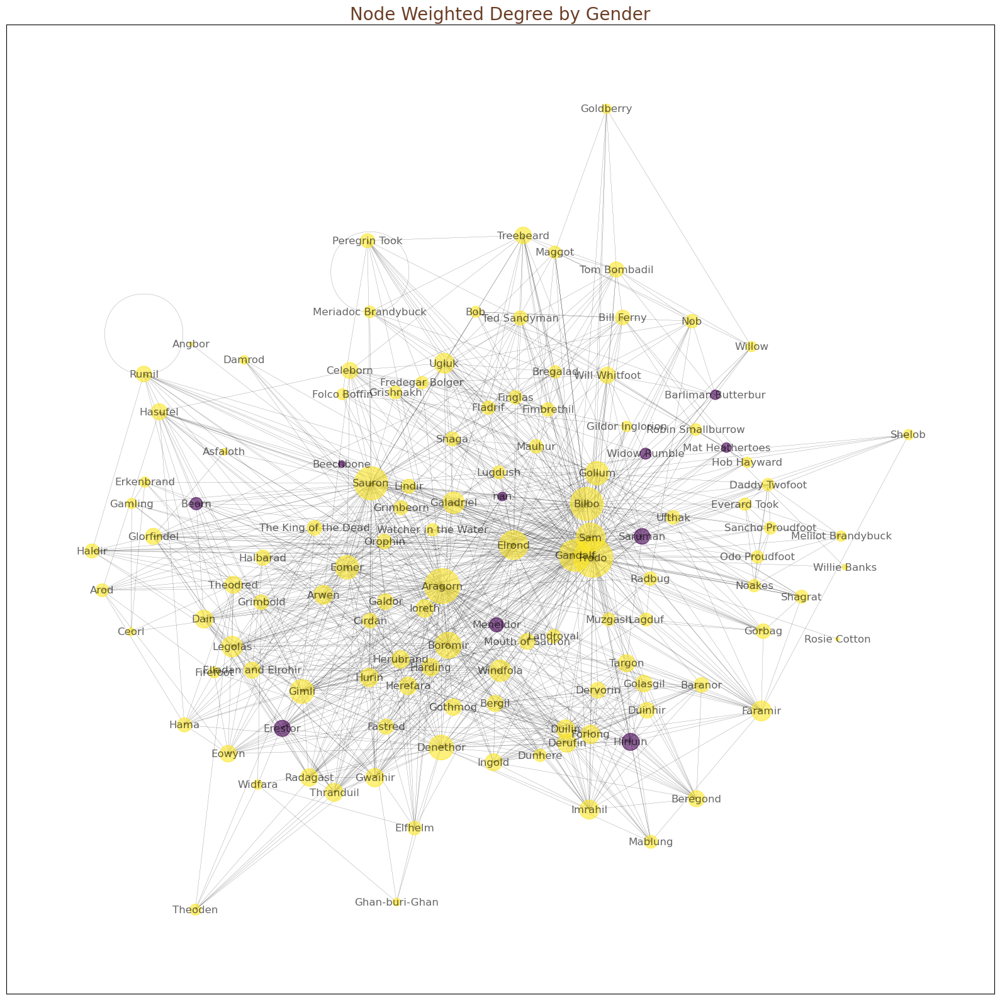

In [54]:
#We are going to plot a graph showing different node color depending on gender and size depending on degree
plt.figure(figsize=(16,16))
plt.title("Node Weighted Degree by Gender", color='#6B3E26', size=20)


pos = nx.kamada_kawai_layout(G)

#Create a dictionary of degrees to use for displaying node sizes by degree
d = dict(G.degree)

#Make types into categories
gend = nodes[['Character', 'Gender']].copy()

gend['Gender'] = pd.Categorical(gend['Gender'])

gend['Gender'].cat.codes
nx.draw_networkx(G, pos = pos,
                 node_color=gend['Gender'].cat.codes,
                 node_size=[v * 20 for v in d.values()],
                 alpha = 0.6, width = 0.2, 
                 with_labels=True)

plt.tight_layout()
plt.show()

### Closeness Centrality

In [59]:
#We are going to calculate betweenness and link it to the nodes
close_dict = nx.closeness_centrality(G) # Run closenness centrality
nx.set_node_attributes(G, close_dict, 'closeness')
sorted_closeness = sorted(close_dict.items(), key=itemgetter(1), reverse=True)

In [60]:
print("Top 10 nodes by closeness centrality:")
for c in sorted_closeness[:10]:
    print(c)

Top 10 nodes by closeness centrality:
('Frodo', 0.8322147651006712)
('Aragorn', 0.7294117647058823)
('Sauron', 0.7045454545454546)
('Bilbo', 0.7005649717514124)
('Gandalf', 0.6739130434782609)
('Elrond', 0.6358974358974359)
('Sam', 0.6358974358974359)
('Boromir', 0.6078431372549019)
('Denethor', 0.5961538461538461)
('Gimli', 0.5876777251184834)


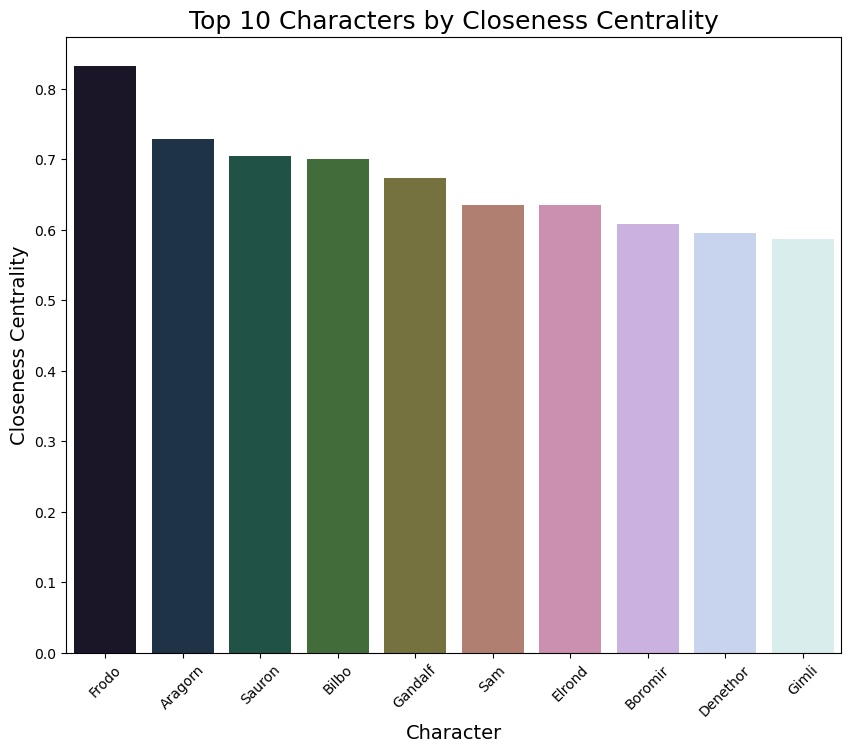

In [126]:
#Create a dataframe from the dictionary an plot the top 10 nodes

close_df = pd.DataFrame.from_dict(close_dict, orient='index', columns=['closeness'])
top10 = close_df.sort_values('closeness', ascending=False)[0:10]


palette_cubehelix = sns.color_palette('cubehelix', n_colors=len(top10))

plt.figure(figsize=(10, 8))
sns.barplot(x=top10.index, y=top10['closeness'], palette=palette_cubehelix)


plt.xlabel('Character', fontsize=14)
plt.ylabel('Closeness Centrality', fontsize=14)
plt.title('Top 10 Characters by Closeness Centrality', fontsize=18)


plt.xticks(rotation=45)

# Show the plot
plt.show()


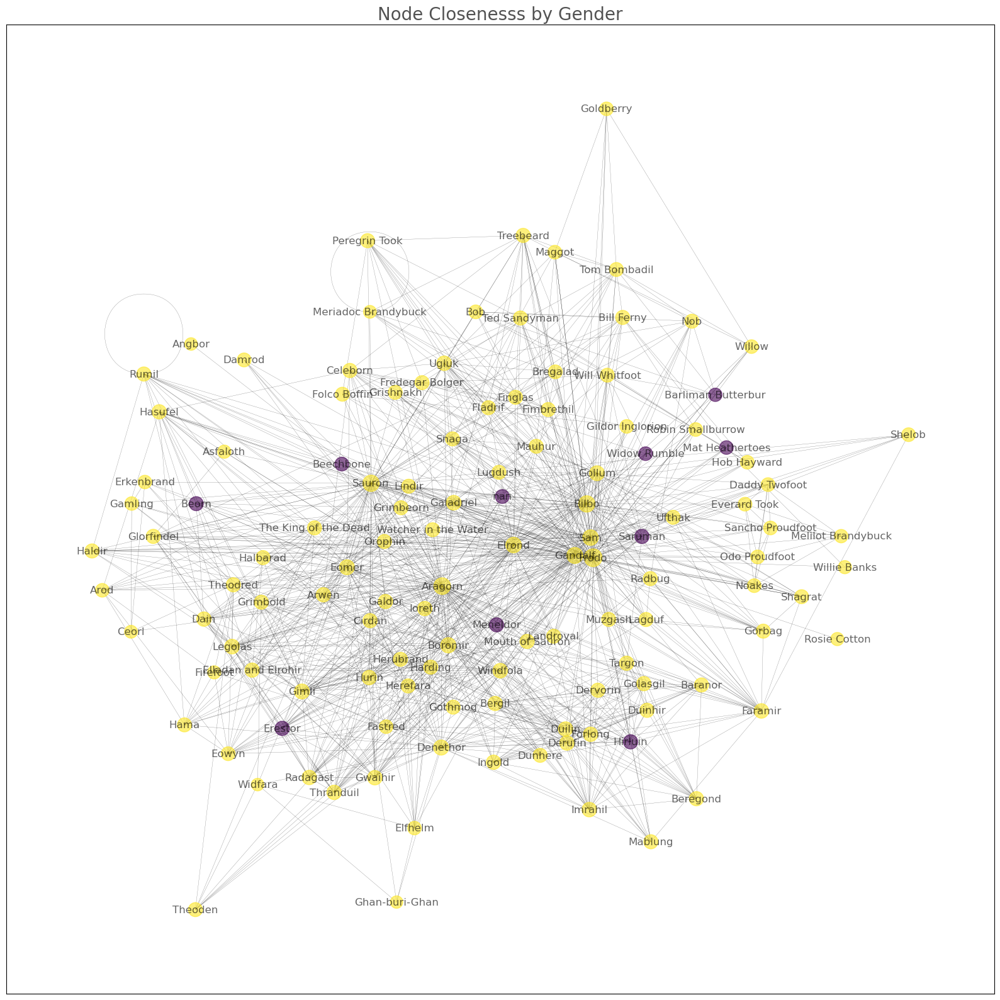

In [66]:
#We are going to plot a graph showing different node color depending on gender and size depending on closeness
plt.figure(figsize=(16,16))
plt.title("Node Closenesss by Gender", color='#525252', size=20)


pos = nx.kamada_kawai_layout(G)

# create dictionary of degrees to use for displaying node sizes by degree
c = dict(nx.closeness_centrality(G))

# Make types into categories
gend = nodes[['Character', 'Gender']].copy()

gend['Gender'] = pd.Categorical(gend['Gender'])
gend['Gender'].cat.codes

nx.draw_networkx(G, pos = pos,
                 node_color=gend['Gender'].cat.codes,
                 node_size=[v * 500 for v in c.values()],
                 alpha = 0.6, width = 0.2, 
                 with_labels=True)

plt.tight_layout()
plt.show()

### Betweennes Centrality

In [67]:
betweenness = nx.betweenness_centrality(G)
betweenness

{'Frodo': 0.23915725866059895,
 'Elrond': 0.03697039949634879,
 'Gandalf': 0.07593614148265687,
 'Saruman': 0.002328205809752803,
 'Theoden': 0.002204024992454811,
 'Sauron': 0.11597660865867034,
 'Bilbo': 0.07848270556035546,
 'Meriadoc Brandybuck': 0.0,
 'Aragorn': 0.12768361072168638,
 'Arwen': 0.004334200929035892,
 'Celeborn': 0.0015454897092912797,
 'Faramir': 0.005336714723347847,
 'Galadriel': 0.008937132153270133,
 'Sam': 0.03711037580741912,
 'Gollum': 0.012148358435980326,
 'Melilot Brandybuck': 0.0,
 'Noakes': 0.00012776198836653225,
 'Odo Proudfoot': 0.00012776198836653225,
 'Sancho Proudfoot': 0.00012776198836653225,
 'Everard Took': 0.00012776198836653225,
 'Daddy Twofoot': 0.00012776198836653225,
 'Folco Boffin': 0.00024517370492752695,
 'Fredegar Bolger': 0.0007244003799880362,
 'Ted Sandyman': 0.0008392201153640021,
 'Peregrin Took': 0.0005480653044411993,
 'Gildor Inglorion': 0.0001574368313156669,
 'Maggot': 0.00043475275575983677,
 'Tom Bombadil': 0.002575766348017

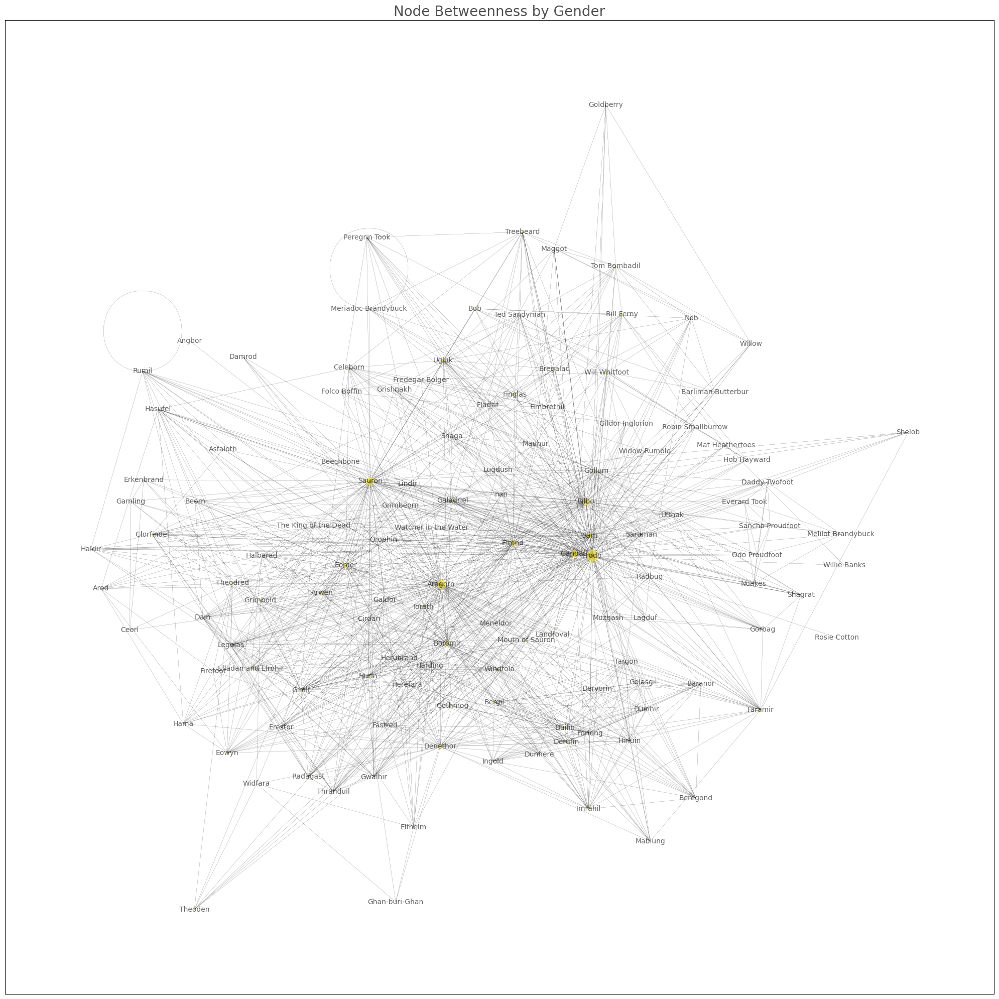

In [130]:
#We are going to plot a graph showing different node color depending on gender and size depending on closeness
pos = nx.kamada_kawai_layout(G)

# Create a dictionary of degrees to use for displaying node sizes by degree
b = dict(nx.betweenness_centrality(G))

# Make types into categories
gend = nodes[['Character', 'Gender']].copy()
gend['Gender'] = pd.Categorical(gend['Gender'])

# Define a color map
color_map = plt.get_cmap('viridis')

# Create the graph
plt.figure(figsize=(20, 20))  # Increase figure size
plt.title("Node Betweenness by Gender", color='#525252', size=20)

nx.draw_networkx(G, pos=pos,
                 node_color=gend['Gender'].cat.codes, cmap=color_map,  # Use colormap
                 node_size=[v * 1000 for v in b.values()],  # Adjust node sizes
                 alpha=0.6, width=0.2,
                 with_labels=True, font_size=10)  # Decrease font size for better visibility

plt.tight_layout()
plt.show()

### Harmoic Centrality

In [71]:
harmonic = nx.harmonic_centrality(G)

In [73]:
ranks = [(k, v) for k, v in sorted(harmonic.items(), key=lambda item: -item[1])]
ranks[0:5]


[('Frodo', 111.83333333333333),
 ('Aragorn', 101.66666666666666),
 ('Sauron', 98.0),
 ('Bilbo', 97.5),
 ('Gandalf', 94.33333333333333)]

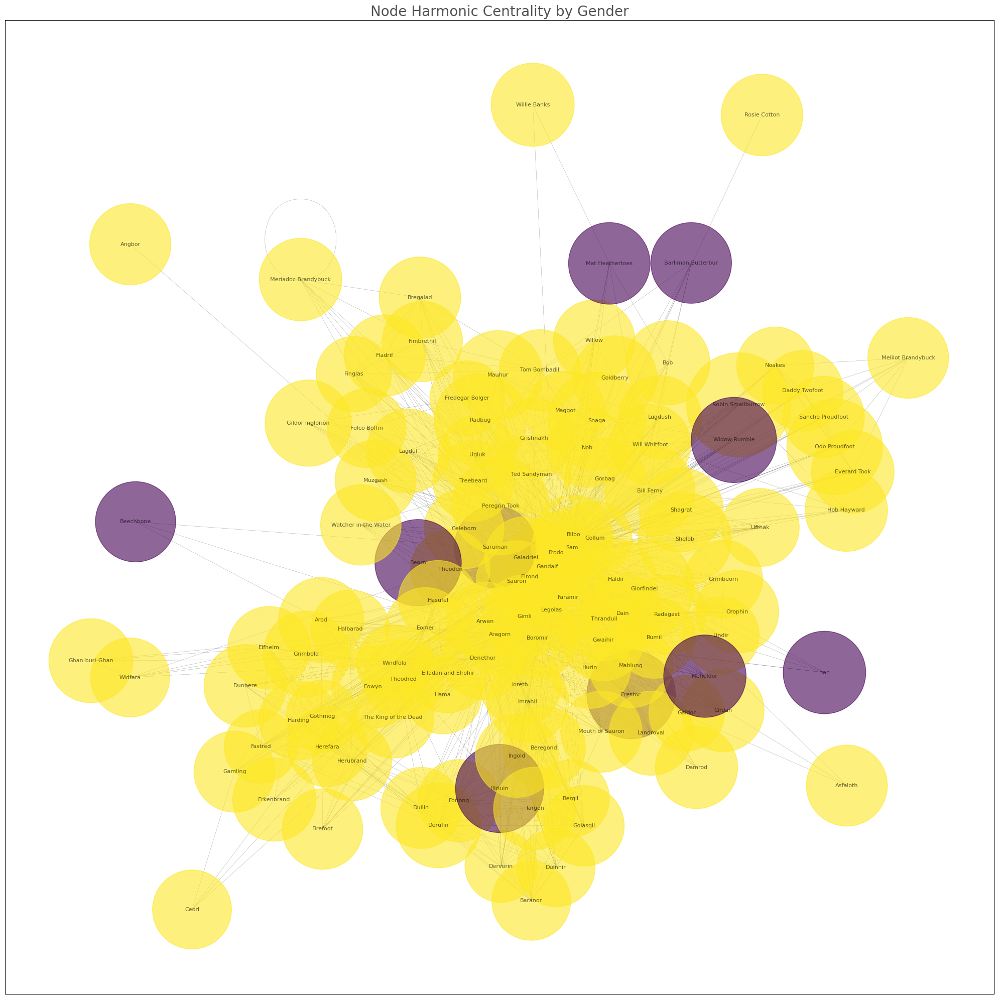

In [137]:
plt.figure(figsize=(20,20))  # Increase figure size
plt.title("Node Harmonic Centrality by Gender", color='#525252', size=20)

# Use a different layout
pos = nx.spring_layout(G, k=0.15)
h = dict(nx.harmonic_centrality(G))
# Make types into categories
gend = nodes[['Character', 'Gender']].copy()

gend['Gender'] = pd.Categorical(gend['Gender'])
gend['Gender'].cat.codes
nx.draw_networkx(G, pos = pos,
                 node_color=gend['Gender'].cat.codes,
                 node_size=[v * 200 for v in h.values()],  # Adjust node sizes
                 alpha = 0.6, width = 0.2, 
                 with_labels=True, font_size=8,  # Adjust label size
                 font_color='black')  # Change label color

plt.tight_layout()
plt.show()


### Eigenvector Centrality

In [75]:
eigen = nx.eigenvector_centrality(G)


In [76]:
ranks = [(k, v) for k, v in sorted(eigen.items(), key=lambda item: -item[1])]
ranks[0:5]

[('Frodo', 0.28791845328966226),
 ('Aragorn', 0.2455150904429829),
 ('Sauron', 0.2344149591384609),
 ('Bilbo', 0.22113889340143672),
 ('Gandalf', 0.19682712944874092)]

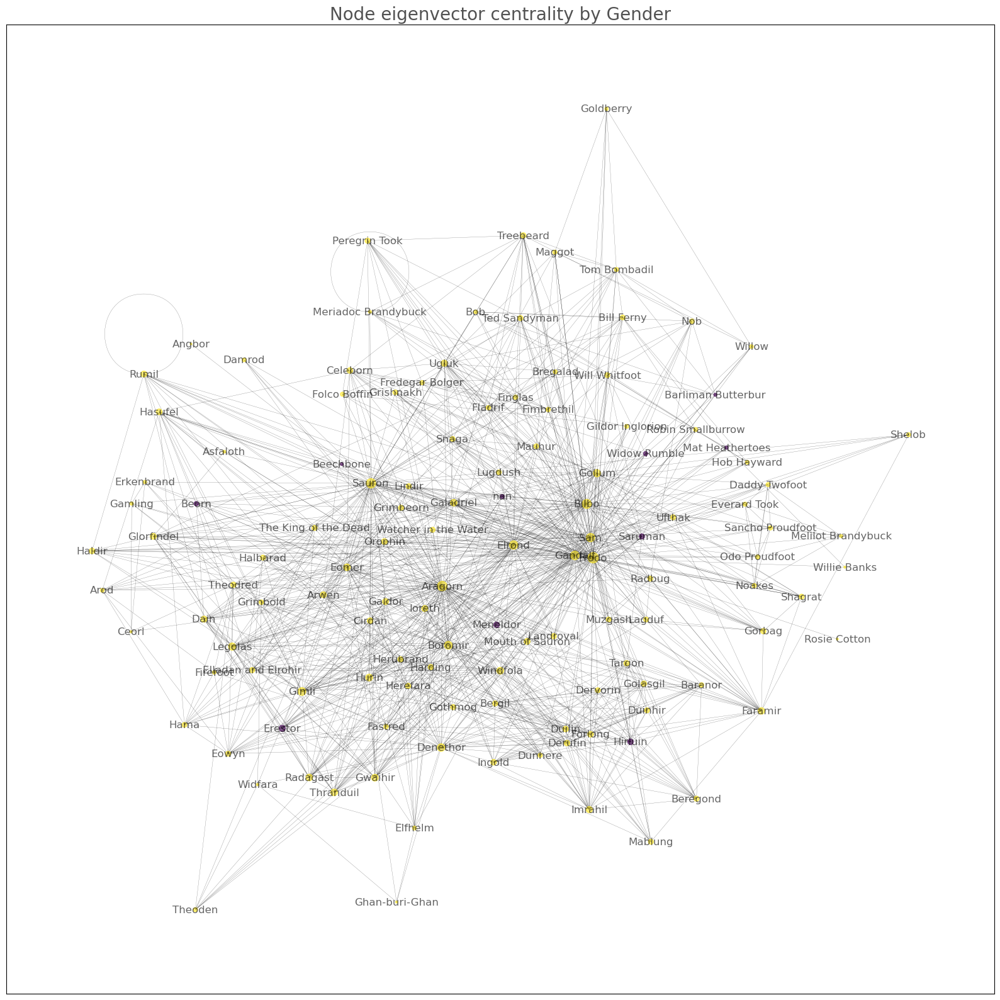

In [140]:
#We are going to plot a graph showing different node color depending on gender and size depending on closeness
plt.figure(figsize=(16,16))
plt.title("Node eigenvector centrality by Gender", color='#525252', size=20)


pos = nx.kamada_kawai_layout(G)

# create dictionary of degrees to use for displaying node sizes by degree
e = dict(nx.eigenvector_centrality(G))

# Make types into categories
gend = nodes[['Character', 'Gender']].copy()

gend['Gender'] = pd.Categorical(gend['Gender'])
gend['Gender'].cat.codes

nx.draw_networkx(G, pos = pos,
                 node_color=gend['Gender'].cat.codes,
                 node_size=[v * 500 for v in e.values()],
                 alpha = 0.6, width = 0.2, 
                 with_labels=True)

plt.tight_layout()
plt.show()

In [79]:
nx.degree_assortativity_coefficient(G)


-0.28635484969516994

In [81]:
knn = nx.algorithms.assortativity.average_neighbor_degree(G)
knn = dict(sorted(knn.items()))


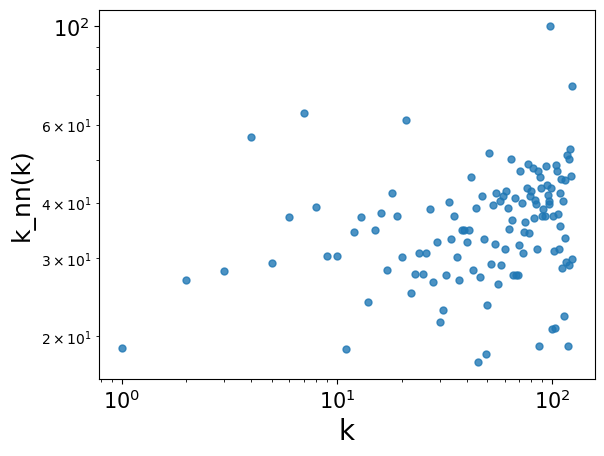

In [82]:
plt.plot(list(knn.keys()), list(knn.values()), '.', ms=10, alpha=0.8)
plt.loglog()
plt.xlabel("k", fontsize=20)
plt.ylabel("k_nn(k)",fontsize=18)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show()

In [84]:
list(G.neighbors('Frodo')) # obtain the list of neighobors for node 0

['Elrond',
 'Gandalf',
 'Saruman',
 'Theoden',
 'Sauron',
 'Bilbo',
 'Celeborn',
 'Faramir',
 'Galadriel',
 'Sam',
 'Gollum',
 'Melilot Brandybuck',
 'Noakes',
 'Odo Proudfoot',
 'Sancho Proudfoot',
 'Everard Took',
 'Daddy Twofoot',
 'Folco Boffin',
 'Fredegar Bolger',
 'Ted Sandyman',
 'Peregrin Took',
 'Gildor Inglorion',
 'Maggot',
 'Tom Bombadil',
 'Goldberry',
 'Willow',
 'Bob',
 'Barliman Butterbur',
 'Nob',
 'Will Whitfoot',
 'Bill Ferny',
 'Glorfindel',
 'Beorn',
 'Dain',
 'Elladan and Elrohir',
 'Grimbeorn',
 'Lindir',
 'Boromir',
 'Cirdan',
 'Denethor',
 'Erestor',
 'Galdor',
 'Gimli',
 'Gwaihir',
 'Hurin',
 'Legolas',
 'Radagast',
 'Thranduil',
 'nan',
 'Watcher in the Water',
 'Haldir',
 'Orophin',
 'Rumil',
 'Eomer',
 'Hasufel',
 'Grishnakh',
 'Lugdush',
 'Mauhur',
 'Snaga',
 'Ugluk',
 'Bregalad',
 'Fimbrethil',
 'Finglas',
 'Fladrif',
 'Treebeard',
 'Beechbone',
 'Damrod',
 'Mablung',
 'Shelob',
 'Gorbag',
 'Shagrat',
 'Ufthak',
 'Baranor',
 'Beregond',
 'Bergil',
 'Deru

### Diameter

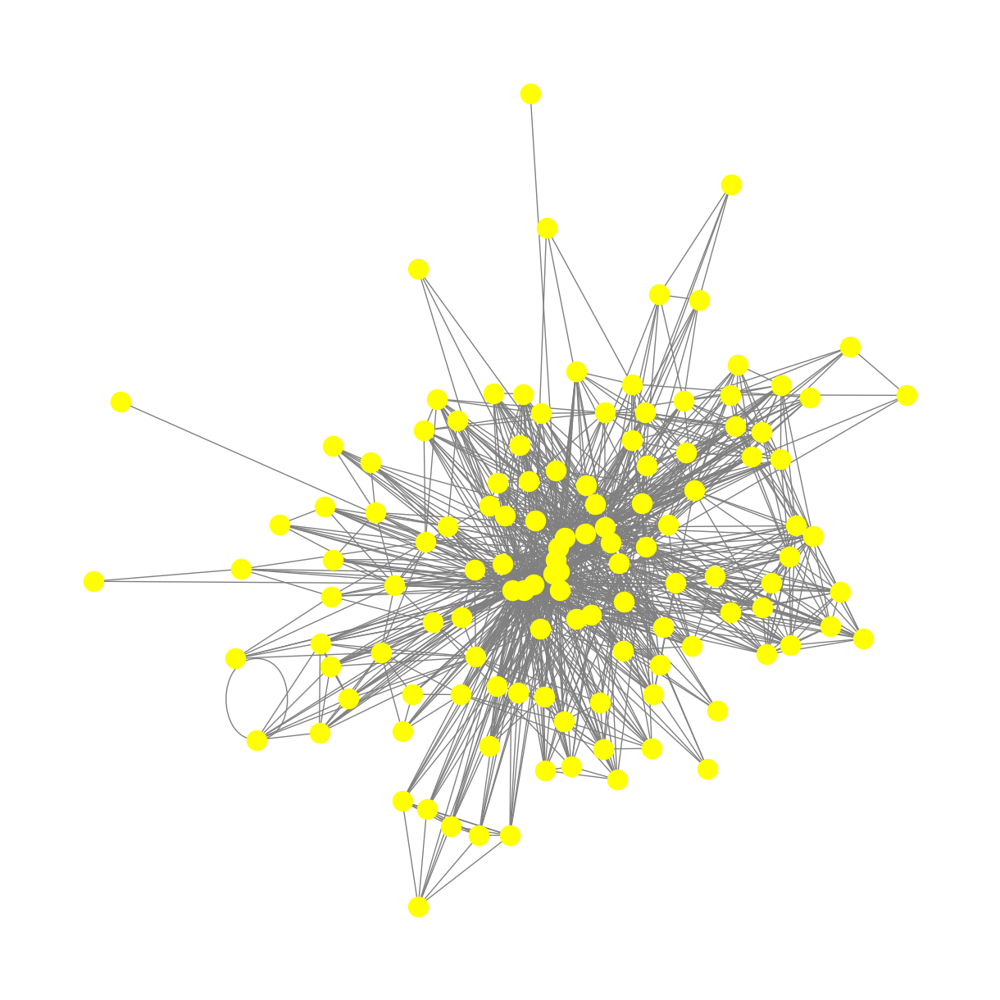

In [144]:
comps = list(nx.connected_components(G)) # get a list of connected components (for decreasing size)
comp_1 = nx.subgraph(G, comps[0]) 
plt.figure(figsize=(12,12))
nx.draw(comp_1, edge_color='gray',node_color='yellow')

In [113]:
nx.diameter(G.subgraph(comps[0])) 

4

In [160]:
print(f"Global clustering: {nx.average_clustering(G)}")

Global clustering: 0.6516058101877149


In [159]:
print(f"Average shortest path: {nx.average_shortest_path_length(G)}")

Average shortest path: 1.9189677419354838


### Density

In [117]:
density=nx.density(g)
print('the edge density is: '+str(density))

the edge density is: 0.14258064516129032


### Local Clustring Coefficient Graph

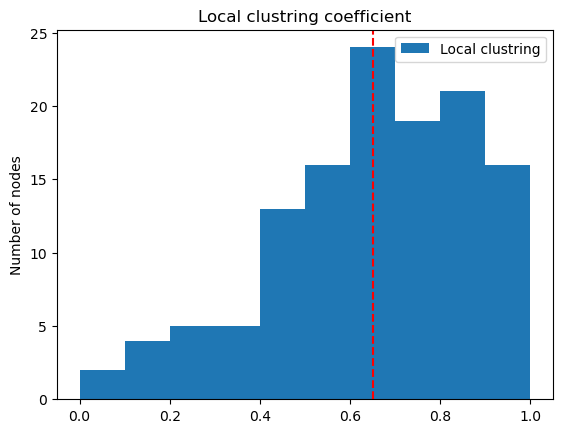

In [118]:
local_clustring_coefficient=nx.algorithms.cluster.clustering(G)
av_local_clustring_coefficient=sum(local_clustring_coefficient.values())/len(local_clustring_coefficient)
plt.hist(local_clustring_coefficient.values(),label='Local clustring')
plt.axvline(av_local_clustring_coefficient,color='r',linestyle='dashed')
plt.legend()
plt.ylabel('Number of nodes')
plt.title('Local clustring coefficient')
plt.show()

### Number of triangle

In [119]:
print('Number of trianglr is: ',len(nx.triangles(G)))

Number of trianglr is:  125


### Ties Strength & Resilience

In [85]:
nx.has_bridges(G)

True

In [86]:
list(nx.bridges(G))

[('Frodo', 'Rosie Cotton'), ('Sauron', 'Angbor')]

In [87]:
list(nx.local_bridges(G, with_span=True))


[('Frodo', 'Beechbone', 3),
 ('Frodo', 'Rosie Cotton', inf),
 ('Theoden', 'Widfara', 3),
 ('Sauron', 'Angbor', inf)]

Tie Strength Measuring Tie Strength for each pair of nodes in the graph through Neighborhood Overlap

In [91]:
def node_overlap(G):
    for u, v in G.edges():
        n_u = set(G.neighbors(u)) # set of u neighbors
        n_v = set(G.neighbors(v)) # set of v neighbors
        overlap = len(n_u & n_v) / len(n_u | n_v) # Neighborhood Overlap
        G[u][v]['overlap'] = overlap
    return G

In [92]:
g = node_overlap(G)


Plotting the KDE (Kernel Density Estimation) of Neighborhood Overlap



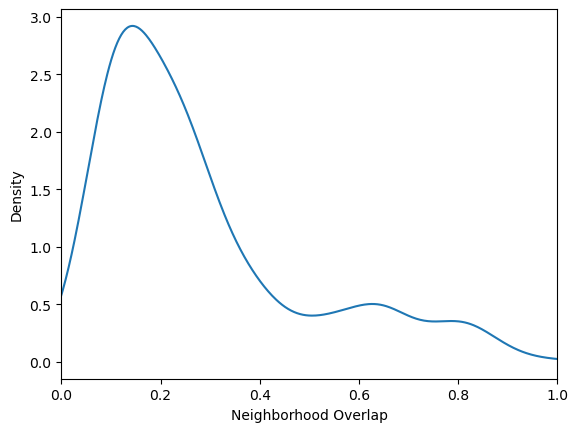

In [93]:
weights = [e[-1]['overlap'] for e in g.edges(data=True)]
pd.DataFrame(weights)[0].plot.kde()
plt.xlabel("Neighborhood Overlap")
plt.xlim(0,1)
plt.show()


Plotting the KDE (Kernel Density Estimation) of Interactions Weights



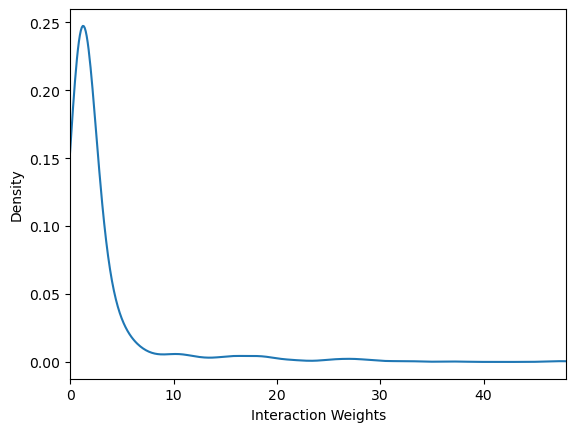

In [94]:
weights_got = [d['weight'] for u,v,d in g.edges(data=True)]
pd.DataFrame(weights_got)[0].plot.kde()
plt.xlabel("Interaction Weights")
plt.xlim(0,max(weights_got))
plt.show()


### Community Discovery

In [99]:
from cdlib import algorithms

Note: to be able to use all crisp methods, you need to install some additional packages:  {'bayanpy', 'graph_tool', 'wurlitzer', 'infomap'}
Note: to be able to use all crisp methods, you need to install some additional packages:  {'pyclustering', 'ASLPAw'}
Note: to be able to use all crisp methods, you need to install some additional packages:  {'wurlitzer', 'infomap'}


In [101]:
leiden_coms = algorithms.leiden(G)

leiden_coms.method_name # Clustering algorithm name

'Leiden'

In [102]:
leiden_coms.method_parameters # Clustering parameters

{'initial_membership': None, 'weights': None}

In [103]:
leiden_coms.communities # Identified Clustering

[['Frodo',
  'Gandalf',
  'Saruman',
  'Theoden',
  'Sauron',
  'Bilbo',
  'Meriadoc Brandybuck',
  'Celeborn',
  'Folco Boffin',
  'Fredegar Bolger',
  'Ted Sandyman',
  'Peregrin Took',
  'Gildor Inglorion',
  'Maggot',
  'Tom Bombadil',
  'Goldberry',
  'Willow',
  'Bob',
  'Barliman Butterbur',
  'Nob',
  'Will Whitfoot',
  'Bill Ferny',
  'nan',
  'Grishnakh',
  'Lugdush',
  'Mauhur',
  'Snaga',
  'Ugluk',
  'Bregalad',
  'Fimbrethil',
  'Finglas',
  'Fladrif',
  'Treebeard',
  'Damrod',
  'Angbor',
  'Rosie Cotton',
  'Willie Banks',
  'Mat Heathertoes',
  'Hob Hayward',
  'Robin Smallburrow',
  'Widow Rumble'],
 ['Aragorn',
  'Arwen',
  'Beorn',
  'Elladan and Elrohir',
  'Arod',
  'Eomer',
  'Hasufel',
  'Eowyn',
  'Firefoot',
  'Hama',
  'Theodred',
  'Ceorl',
  'Erkenbrand',
  'Gamling',
  'Elfhelm',
  'Grimbold',
  'Beechbone',
  'Halbarad',
  'The King of the Dead',
  'Dunhere',
  'Windfola',
  'Ghan-buri-Ghan',
  'Widfara',
  'Fastred',
  'Gothmog',
  'Harding',
  'Herefar

In [104]:
leiden_coms.overlap # Wehter the clustering is overlapping or not

False

In [105]:
leiden_coms.node_coverage # Percentage of nodes covered by the clustering


1.0

In [106]:
leiden_coms.average_internal_degree()


FitnessResult(min=8.0, max=12.875, score=9.886023123218246, std=1.6520086849655988)

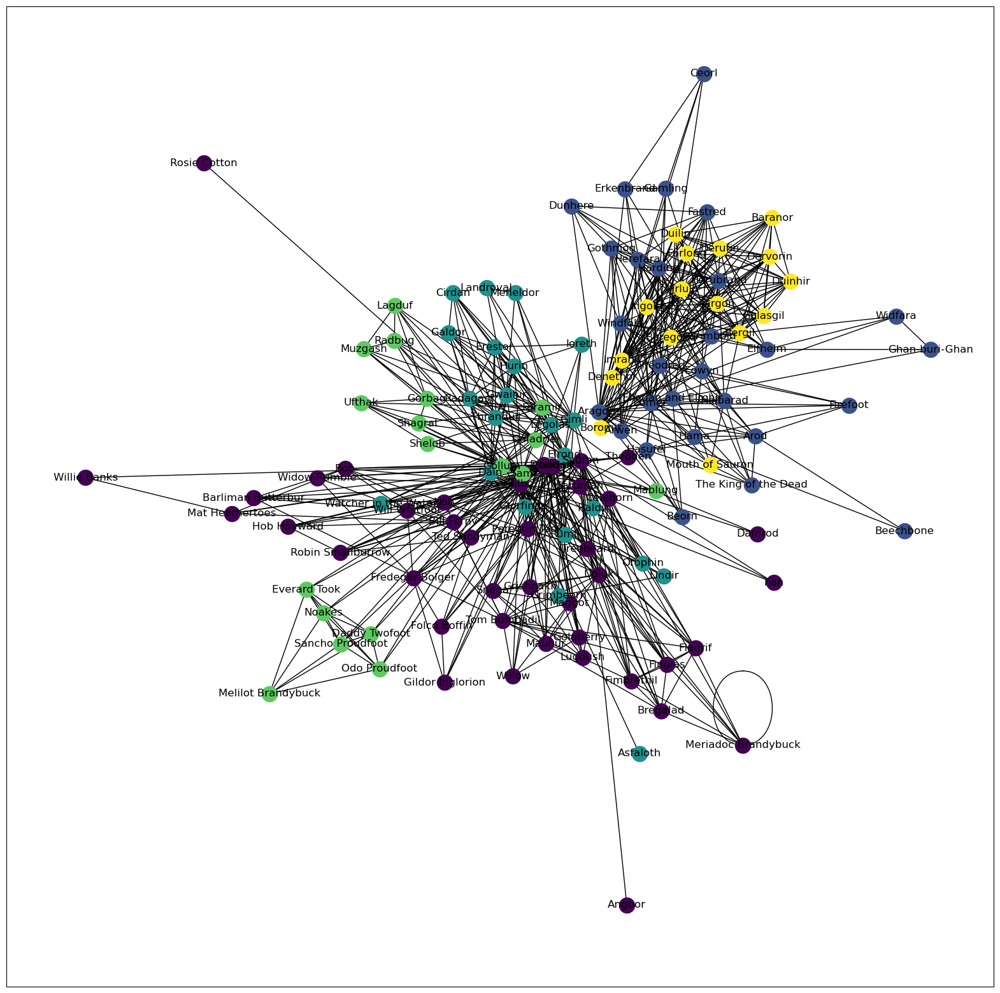

In [151]:
import matplotlib.cm as cm

# Get the list of communities
communities = leiden_coms.communities

# Create a color map with as many colors as there are communities
cmap = cm.get_cmap('viridis', len(communities))

plt.figure(figsize=(20, 20))

# Draw each community using a different color
for i, community in enumerate(communities):
    nx.draw_networkx(nx.subgraph(g, community), pos=pos, node_color=cmap(i), with_labels=True)

plt.show()


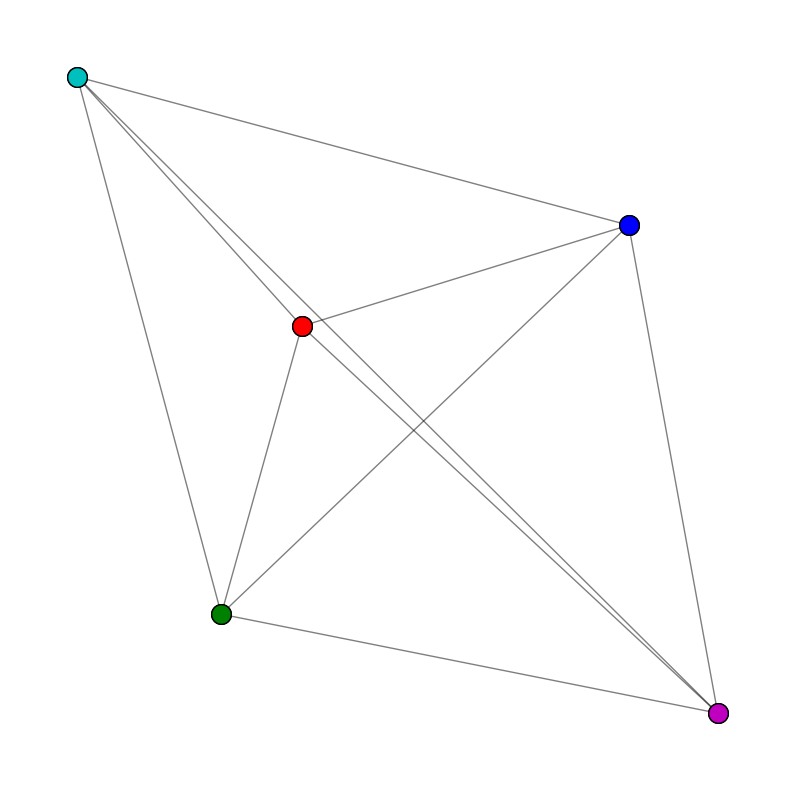

In [156]:
viz.plot_community_graph(g, leiden_coms, figsize=(10, 10))